# Lab 09 — Seeing Every Pixel

**One session · 1h30 · pretrained model · no training**

Today an image classifier becomes a *dense predictor*. You will open a pretrained segmenter, watch spatial feature maps move through it, and turn its output into colorful semantic masks.

You are not building or training a model. The supplied cells handle downloads, preprocessing, hooks, and plotting. Your work is to **manipulate images, inspect tensors, and explain what the network sees**.

## Session map

| Time | Investigation | Visible evidence |
|---:|---|---|
| 0–10 min | What is semantic segmentation? | image and pixel labels |
| 10–25 min | What is inside the model? | module map and parameter counts |
| 25–40 min | What survives through the backbone? | feature-map gallery |
| 40–55 min | How do scores become a mask? | 21 score maps → one mask |
| 55–75 min | What does the model see? | masks, overlays, confidence |
| 75–85 min | How stable is its interpretation? | transformed-image comparison |
| 85–90 min | What did we learn? | visual exit ticket |

> **Rule for today:** every answer must point to an image, tensor shape, or visualization.

## 0 — Start the visual laboratory

Run the supplied setup cell. On the first run, TorchVision downloads the lightweight pretrained LRASPP weights and six small test images. Later runs reuse the cache.

In [1]:
from __future__ import annotations

from pathlib import Path
from urllib.request import urlretrieve

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image, ImageFile
from torchvision.models.segmentation import (
    LRASPP_MobileNet_V3_Large_Weights,
    lraspp_mobilenet_v3_large,
)
from torchvision.transforms import functional as TF

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ImageFile.LOAD_TRUNCATED_IMAGES = True  # tolerate harmless missing JPEG end bytes
DATA_DIR = Path("data/segmentation-scenes")
DATA_DIR.mkdir(parents=True, exist_ok=True)

# Six photographs from the official COCO validation image server.
SAMPLE_IMAGES = {
    "cats": "http://images.cocodataset.org/val2017/000000039769.jpg",
    "kitchen": "http://images.cocodataset.org/val2017/000000397133.jpg",
    "living_room": "http://images.cocodataset.org/val2017/000000000139.jpg",
    "city_people": "http://images.cocodataset.org/val2017/000000252219.jpg",
    "dog_and_cat": "http://images.cocodataset.org/val2017/000000219578.jpg",
    "challenge_scene": "http://images.cocodataset.org/val2017/000000037777.jpg",
}

for name, url in SAMPLE_IMAGES.items():
    target = DATA_DIR / f"{name}.jpg"
    if not target.exists():
        try:
            urlretrieve(url, target)
        except Exception as exc:
            print(f"Could not download {name}: {exc}")

available = {name: DATA_DIR / f"{name}.jpg" for name in SAMPLE_IMAGES
             if (DATA_DIR / f"{name}.jpg").exists()}
assert available, "No sample image is available. Check the internet connection once."

weights = LRASPP_MobileNet_V3_Large_Weights.DEFAULT
model = lraspp_mobilenet_v3_large(weights=weights).to(DEVICE).eval()
preprocess = weights.transforms()
CLASSES = weights.meta["categories"]

# A stable PASCAL-style palette: one distinct color for each class index.
def make_palette(n):
    palette = np.zeros((n, 3), dtype=np.uint8)
    for label in range(n):
        value, bit = label, 0
        while value:
            palette[label, 0] |= ((value >> 0) & 1) << (7 - bit)
            palette[label, 1] |= ((value >> 1) & 1) << (7 - bit)
            palette[label, 2] |= ((value >> 2) & 1) << (7 - bit)
            bit += 1; value >>= 3
    return palette

PALETTE = make_palette(len(CLASSES))

def save_preview(fig, filename):
    target = Path("../assets")
    target.mkdir(parents=True, exist_ok=True)
    fig.savefig(target / filename, dpi=170, bbox_inches="tight")

print(f"PyTorch {torch.__version__} · device={DEVICE} · {len(CLASSES)} output classes")

PyTorch 2.14.0+cu130 · device=cpu · 21 output classes


### First contact: six scenes, six predictions waiting to happen

The model knows only its fixed label vocabulary. Before running it, choose two scenes and predict which regions it will recognize confidently.

**My prediction:** …

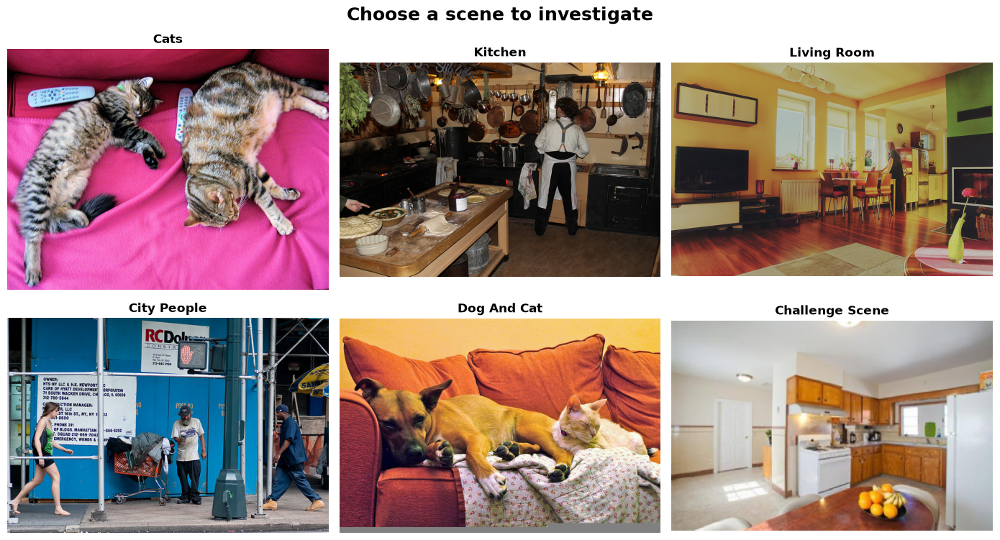

In [2]:
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
for ax, (name, path) in zip(axes.flat, available.items()):
    ax.imshow(Image.open(path).convert("RGB"))
    ax.set_title(name.replace("_", " ").title(), weight="bold")
    ax.axis("off")
for ax in axes.flat[len(available):]: ax.axis("off")
fig.suptitle("Choose a scene to investigate", fontsize=18, weight="bold")
fig.tight_layout(); save_preview(fig, "scene-gallery.png"); plt.show()

## 1 — One image becomes a tensor

Change `IMAGE_NAME` to any title in the gallery. This is the main control you will revisit throughout the notebook.

PIL image size (width, height): (640, 480)
Model input (batch, channels, height, width): (1, 3, 520, 693)


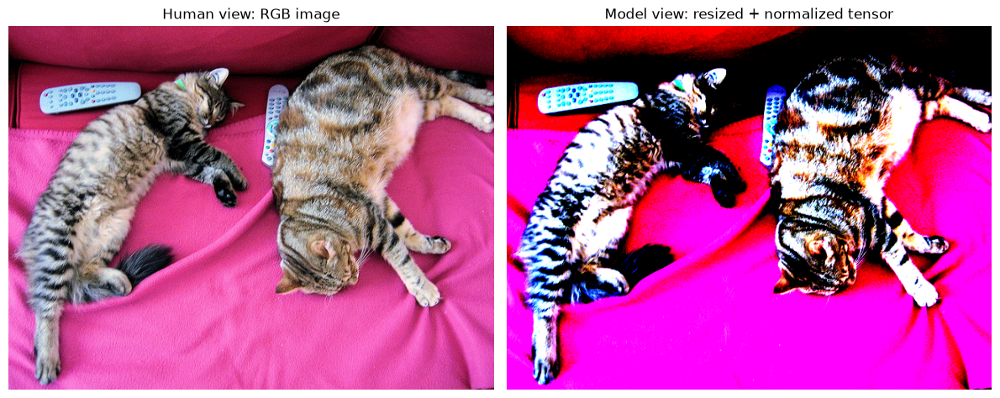

In [3]:
# YOUR CHOICE: cats, kitchen, living_room, city_people, dog_and_cat, or challenge_scene
IMAGE_NAME = "cats"

image = Image.open(available[IMAGE_NAME]).convert("RGB")
input_tensor = preprocess(image).unsqueeze(0).to(DEVICE)

print("PIL image size (width, height):", image.size)
print("Model input (batch, channels, height, width):", tuple(input_tensor.shape))

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(image); axes[0].set_title("Human view: RGB image")
axes[1].imshow(input_tensor[0].cpu().permute(1, 2, 0).clip(0, 1))
axes[1].set_title("Model view: resized + normalized tensor")
for ax in axes: ax.axis("off")
fig.tight_layout(); plt.show()

### Pause and read the contract

1. Which axis holds the three color channels?
2. Why does the model need a batch axis even for one image?
3. Did preprocessing preserve the original aspect ratio?

**Your observations:** …

## 2 — Open the pretrained model

LRASPP–MobileNetV3 has two visible parts:

```text
RGB image → MobileNetV3 backbone → low/high spatial features → LRASPP classifier → class scores
```

The backbone does not end in one class vector. It returns a grid of features because the final decision must return to every pixel.

In [4]:
def parameter_count(module):
    return sum(p.numel() for p in module.parameters())

print(model)
print("\nBackbone parameters:", f"{parameter_count(model.backbone):,}")
print("Classifier parameters:", f"{parameter_count(model.classifier):,}")
print("Total parameters:", f"{parameter_count(model):,}")

LRASPP(
  (backbone): IntermediateLayerGetter(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, bias=True, track_running_stats=True)
      (2): Hardswish()
    )
    (1): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=16, bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, bias=True, track_running_stats=True)
          (2): ReLU(inplace=True)
        )
        (1): Conv2dNormActivation(
          (0): Conv2d(16, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(16, eps=0.001, momentum=0.01, affine=True, bias=True, track_running_stats=True)
        )
      )
    )
    (2): InvertedResidual(
      (block): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 

### Architecture scavenger hunt

Use the printed architecture to find:

- the first convolution and its stride;
- the sequence of MobileNet inverted-residual blocks;
- the final classifier convolution;
- the number of output channels in that last convolution.

**Why must the final number of channels equal the number of class names?** …

## 3 — Watch spatial features travel through the network

The supplied hooks take snapshots without modifying the model. Predict first: will feature maps become spatially larger or smaller as depth increases?

**Prediction:** …

In [5]:
snapshots = {}

def remember(name):
    def hook(_module, _inputs, output):
        snapshots[name] = output.detach().cpu()
    return hook

# Sample five ordered backbone blocks from early to late depth.
backbone_blocks = list(model.backbone.named_children())
sampled = np.linspace(0, len(backbone_blocks) - 1, 5, dtype=int)
observed_layers = {
    f"block {backbone_blocks[i][0]}": backbone_blocks[i][1] for i in sampled
}
observed_layers["classifier"] = model.classifier
handles = [layer.register_forward_hook(remember(name))
           for name, layer in observed_layers.items()]
with torch.inference_mode():
    output = model(input_tensor)
for handle in handles: handle.remove()

for name, activation in snapshots.items():
    print(f"{name:10s} → {tuple(activation.shape)}")
print("returned output →", tuple(output["out"].shape))

block 0    → (1, 16, 260, 347)
block 4    → (1, 40, 65, 87)
block 8    → (1, 80, 33, 44)
block 12   → (1, 112, 33, 44)
block 16   → (1, 960, 33, 44)
classifier → (1, 21, 65, 87)
returned output → (1, 21, 520, 693)


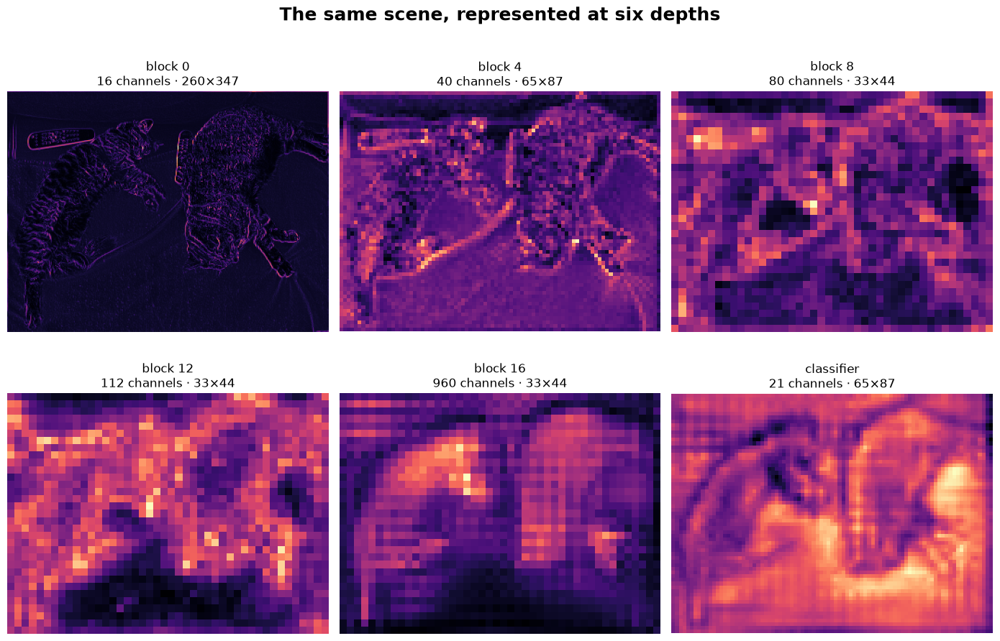

In [6]:
fig, axes = plt.subplots(2, 3, figsize=(14, 9.5))
for ax, (name, activation) in zip(axes.flat, snapshots.items()):
    # Channel energy gives one readable summary of hundreds of feature maps.
    view = activation[0].square().mean(0).sqrt()
    ax.imshow(view, cmap="magma")
    ax.set_title(f"{name}\n{activation.shape[1]} channels · {activation.shape[-2]}×{activation.shape[-1]}")
    ax.axis("off")
fig.suptitle("The same scene, represented at six depths", fontsize=18, weight="bold")
fig.tight_layout(rect=[0, 0, 1, .96], h_pad=3.5)
save_preview(fig, "feature-gallery.png"); plt.show()

### Interpret the internal movie

1. Where does spatial resolution fall most sharply?
2. Where does the number of channels grow?
3. Which display still resembles image structure most clearly?
4. Why is the classifier output coarse before it is resized?

**Your explanation:** …

## 4 — Twenty-one score maps become one semantic mask

At every output position, the network supplies one score per class. `argmax` asks which class has the largest score **at each pixel**.

In [7]:
logits = output["out"][0].cpu()             # [classes, height, width]
probabilities = logits.softmax(dim=0)
confidence, prediction = probabilities.max(dim=0)

present_ids = prediction.unique().tolist()
present_classes = [(index, CLASSES[index], int((prediction == index).sum()))
                   for index in present_ids]

print("logits:", tuple(logits.shape))
print("prediction:", tuple(prediction.shape))
print("classes found:")
for index, name, pixels in sorted(present_classes, key=lambda row: -row[2]):
    print(f"  {index:2d} · {name:12s} · {pixels:,} pixels")

logits: (21, 520, 693)
prediction: (520, 693)
classes found:
  18 · sofa         · 209,566 pixels
   8 · cat          · 133,928 pixels
   0 · __background__ · 16,866 pixels


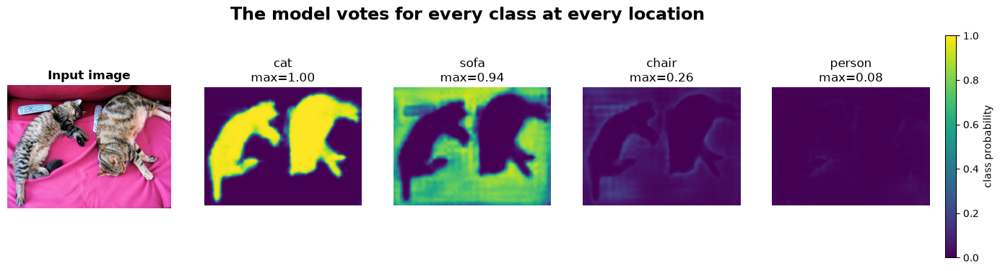

In [8]:
# Show the four strongest non-background class-score maps.
strength = probabilities.flatten(1).amax(1)
candidate_ids = [i for i in strength.argsort(descending=True).tolist() if i != 0][:4]

fig, axes = plt.subplots(1, 5, figsize=(17, 4))
axes[0].imshow(image); axes[0].set_title("Input image", weight="bold"); axes[0].axis("off")
for ax, class_id in zip(axes[1:], candidate_ids):
    heat = probabilities[class_id]
    shown = ax.imshow(heat, cmap="viridis", vmin=0, vmax=1)
    ax.set_title(f"{CLASSES[class_id]}\nmax={heat.max():.2f}")
    ax.axis("off")
fig.colorbar(shown, ax=axes[1:].tolist(), fraction=.018, pad=.02, label="class probability")
fig.suptitle("The model votes for every class at every location", fontsize=17, weight="bold")
save_preview(fig, "class-score-maps.png"); plt.show()

### The decisive line

Complete the expression mentally before running it:

```python
prediction = logits.argmax(dim=____)
```

Why would `dim=1` be wrong after the batch dimension has already been removed?

## 5 — Make the prediction visible

The class-index mask is correct but hard to read as raw numbers. A palette turns indices into colors; an overlay reconnects those colors to the scene.

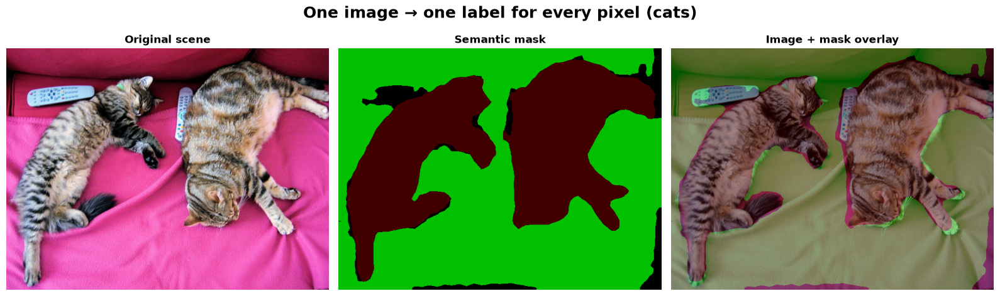

In [9]:
def colorize(mask):
    return PALETTE[mask.numpy()]

def resize_rgb(pil_image, height, width):
    return np.asarray(pil_image.resize((width, height), Image.Resampling.BILINEAR))

mask_rgb = colorize(prediction)
image_rgb = resize_rgb(image, *prediction.shape)
overlay = (0.55 * image_rgb + 0.45 * mask_rgb).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for ax, content, title in zip(
    axes,
    [image_rgb, mask_rgb, overlay],
    ["Original scene", "Semantic mask", "Image + mask overlay"],
):
    ax.imshow(content); ax.set_title(title, weight="bold"); ax.axis("off")
fig.suptitle(f"One image → one label for every pixel ({IMAGE_NAME})", fontsize=18, weight="bold")
fig.tight_layout(); save_preview(fig, "mask-overlay.png"); plt.show()

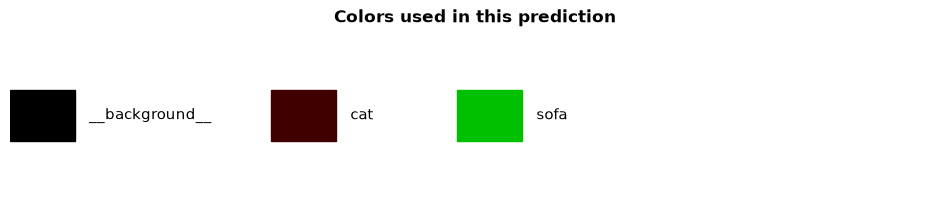

In [10]:
# A legend containing only the classes that actually appear.
fig, ax = plt.subplots(figsize=(12, 2.2))
ax.axis("off")
x = 0
for class_id in present_ids:
    ax.add_patch(plt.Rectangle((x, .35), .07, .3,
                              color=PALETTE[class_id] / 255))
    ax.text(x + .085, .5, CLASSES[class_id], va="center", fontsize=11)
    x += max(.20, .085 + .014 * len(CLASSES[class_id]))
ax.set_xlim(0, max(x, 1)); ax.set_ylim(0, 1)
ax.set_title("Colors used in this prediction", weight="bold")
plt.show()

### Look closely

Name one example of each, if present:

- a large region the model gets right;
- a boundary that looks too coarse;
- a small object that disappears;
- a region assigned to a plausible but wrong class;
- two objects of the same class receiving the same semantic label.

**Visual notes:** …

## 6 — Where is the model unsure?

A prediction always chooses a winner, even when no class wins convincingly. Use confidence to separate “the model predicted this” from “the model strongly believes this.”

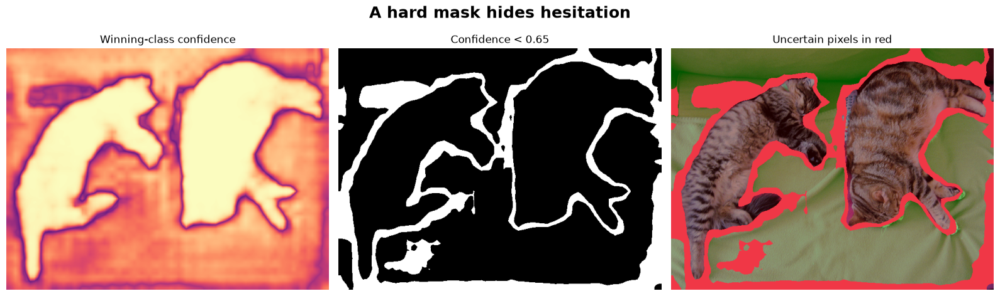

Uncertain pixels: 20.5%


In [11]:
uncertain = confidence < 0.65
uncertainty_view = overlay.copy()
uncertainty_view[uncertain.numpy()] = [240, 55, 70]

fig, axes = plt.subplots(1, 3, figsize=(16, 5))
axes[0].imshow(confidence, cmap="magma", vmin=0, vmax=1)
axes[0].set_title("Winning-class confidence")
axes[1].imshow(uncertain, cmap="gray")
axes[1].set_title("Confidence < 0.65")
axes[2].imshow(uncertainty_view)
axes[2].set_title("Uncertain pixels in red")
for ax in axes: ax.axis("off")
fig.suptitle("A hard mask hides hesitation", fontsize=18, weight="bold")
fig.tight_layout(); save_preview(fig, "confidence-gallery.png"); plt.show()

print(f"Uncertain pixels: {uncertain.float().mean():.1%}")

### Change one visual decision

Try confidence thresholds `0.40`, `0.65`, and `0.85`. The model does not change—only your rule for calling a prediction uncertain changes.

Where does uncertainty concentrate: object interiors, boundaries, small objects, or unfamiliar regions?

**Observation:** …

## 7 — The “oh!” gallery: run every scene

This supplied function repeats the same inference pipeline. It is intentionally compact: the goal is to compare visual behavior, not copy boilerplate.

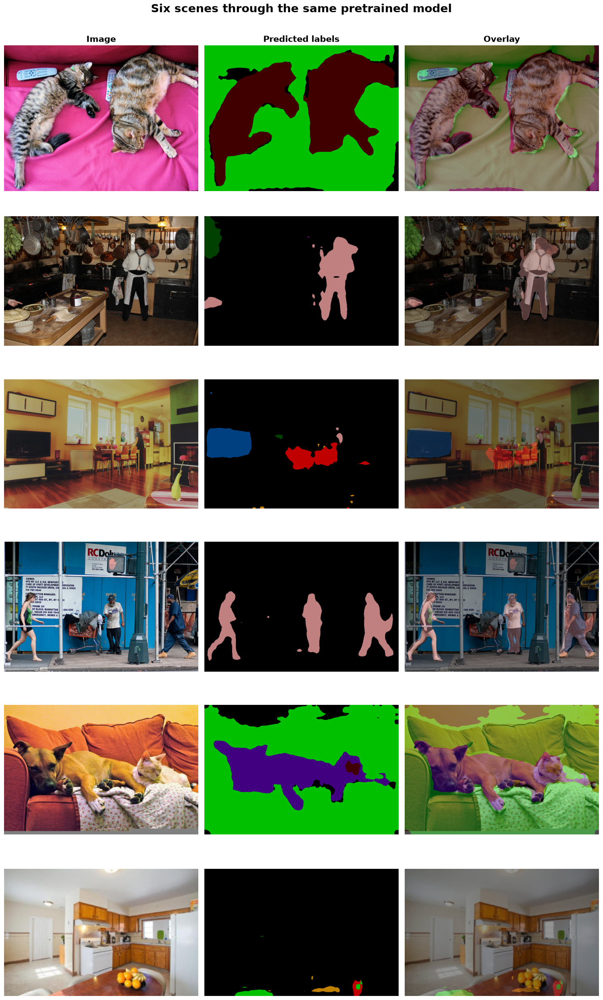

In [12]:
@torch.inference_mode()
def segment(pil_image):
    tensor = preprocess(pil_image).unsqueeze(0).to(DEVICE)
    scores = model(tensor)["out"][0].cpu()
    probs = scores.softmax(0)
    conf, mask = probs.max(0)
    rgb = resize_rgb(pil_image, *mask.shape)
    colors = colorize(mask)
    blended = (0.58 * rgb + 0.42 * colors).astype(np.uint8)
    return mask, conf, colors, blended

fig, axes = plt.subplots(len(available), 3, figsize=(15, 4.2 * len(available)))
for row, (name, path) in enumerate(available.items()):
    scene = Image.open(path).convert("RGB")
    mask, conf, colors, blended = segment(scene)
    rgb = resize_rgb(scene, *mask.shape)
    axes[row, 0].imshow(rgb)
    axes[row, 1].imshow(colors)
    axes[row, 2].imshow(blended)
    axes[row, 0].set_ylabel(name.title(), fontsize=13, weight="bold")
    for col in range(3): axes[row, col].axis("off")
for ax, title in zip(axes[0], ["Image", "Predicted labels", "Overlay"]):
    ax.set_title(title, fontsize=15, weight="bold")
fig.suptitle("Six scenes through the same pretrained model", fontsize=20, weight="bold", y=1.0)
fig.tight_layout(); save_preview(fig, "all-scenes-gallery.png"); plt.show()

### Compare, do not score

Choose the most impressive and most surprising scene.

| Scene | What worked? | What failed? | Your explanation |
|---|---|---|---|
| Most impressive | … | … | … |
| Most surprising | … | … | … |

Do not invent an accuracy number: these images have no ground-truth masks in this notebook. Careful qualitative evidence is the correct tool here.

## 8 — Manipulate the input; does the interpretation survive?

A horizontal flip should not change the meaning of a dog, person, or car. Test whether the predicted mask is consistent after flipping the result back.

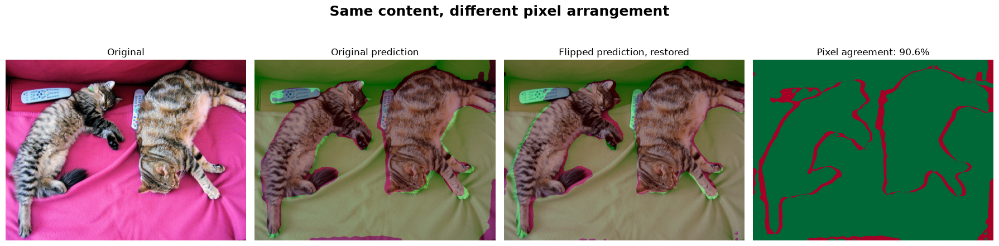

In [13]:
flipped_image = TF.hflip(image)
flip_mask, _, flip_colors, flip_overlay = segment(flipped_image)
flip_mask_back = torch.flip(flip_mask, dims=[1])

agreement = (prediction == flip_mask_back).float()
flip_overlay_back = np.fliplr(flip_overlay)

fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(image_rgb); axes[0].set_title("Original")
axes[1].imshow(overlay); axes[1].set_title("Original prediction")
axes[2].imshow(flip_overlay_back); axes[2].set_title("Flipped prediction, restored")
axes[3].imshow(agreement, cmap="RdYlGn", vmin=0, vmax=1)
axes[3].set_title(f"Pixel agreement: {agreement.mean():.1%}")
for ax in axes: ax.axis("off")
fig.suptitle("Same content, different pixel arrangement", fontsize=18, weight="bold")
fig.tight_layout(); save_preview(fig, "flip-consistency.png"); plt.show()

### Interpret the disagreement

Inspect the red regions. Are they concentrated near boundaries, small objects, or large object interiors? Does the disagreement change your trust in the hard mask?

**Your explanation:** …

## 9 — Exit ticket: tell the story of one scene

Submit the executed notebook with your selected image and all plots visible. Answer briefly:

1. What does each axis of `[1, 21, H, W]` mean?
2. What role does the backbone play? What role does the classifier play?
3. Why is `argmax(dim=0)` a pixel-wise decision here?
4. Cite one visible success and one visible failure.
5. Where was the model uncertain, and why might that region be difficult?
6. What information would **instance segmentation** add to this output?

**Final sentence:** Semantic segmentation is not “one label for an image”; it is …

## Image and model sources

- Model and preprocessing: TorchVision `LRASPP_MobileNet_V3_Large_Weights.DEFAULT`, trained on the PASCAL VOC categories available through the COCO subset.
- Test scenes: COCO 2017 validation images, downloaded from the official COCO image server.

The images are used only for classroom model inspection. Keep these source notes with any screenshots you export.